# CarNet: EfficientNet + ML Decoder

## The goal is to classify stanford car dataset by fusing EfficientNet as backbone and ML-Decoder as classification network.

Author:


> Rohit Patil 





###Mount google drive with stanford car dataset

├── input<br>
│   ├── car_data<br>
│   │   └── car_data<br>
│   │       ├── test<br>
│   │       └── train<br>
│   ├── anno_test.csv<br>
│   ├── anno_train.csv<br>
│   └── names.csv<br>
├── outputs<br>
│   ├── cam_results <br>
│   ├── accuracy.png<br>
│   ├── loss.png<br>
│   └── model.pth<br>


In [1]:
# This mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive')

# TODO: Enter the foldername in your Drive where you have saved the unzipped
FOLDERNAME = 'enpm809k/CarNet/'
assert FOLDERNAME is not None, "[!] Enter the foldername."

# Now that we've mounted your Drive, this ensures that
# the Python interpreter of the Colab VM can load
# python files from within it.
import sys
sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

%cd /content/drive/My\ Drive/$FOLDERNAME

Mounted at /content/drive
/content/drive/My Drive/enpm809k/CarNet


###Import dependencies

In [2]:
!pip install torchmetrics
import argparse
import torch.nn as nn
import torch.optim as optim
import time
from tqdm.auto import tqdm
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision import utils
import numpy as np
import cv2
import PIL
from PIL import Image
from torchmetrics.classification import MulticlassAccuracy, MulticlassF1Score
torch.backends.cuda.matmul.allow_tf32 = False
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.allow_tf32 = True
torch.cuda.synchronize()
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True
!pip install efficientnet_pytorch
!pip install torchinfo
from torchinfo import summary
import glob as glob
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import os, random
from torchvision import transforms
from torch.nn import functional as F
from torch import topk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 512 kB 15.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=7841c9803b2235e5b5c8fa96f9151dde0c2c7543e8e477db334b5765d2a7b550
  Stored in directory: /root/.cache/pip/wheels/84/b9/90/25a0195cf95fb5533db96f1c77ea3f296b7cc86ae8ae48e3dc
Successfully built efficientnet-pytorch
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### ML-Decoder Network
[ML-Decoder: Scalable and Versatile Classification Head](https://arxiv.org/pdf/2111.12933.pdf)

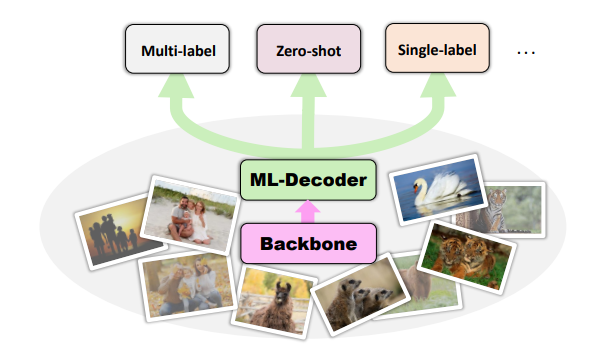

In [5]:
from typing import Optional

import torch
from torch import nn, Tensor
from torch.nn.modules.transformer import _get_activation_fn

class TransformerDecoderLayerOptimal(nn.Module):
    def __init__(self, d_model, nhead=8, dim_feedforward=2048, dropout=0.1, activation="relu",
                 layer_norm_eps=1e-5) -> None:
        super(TransformerDecoderLayerOptimal, self).__init__()
        self.norm1 = nn.LayerNorm(d_model, eps=layer_norm_eps)
        self.dropout = nn.Dropout(dropout)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Implementation of Feedforward model
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        self.norm2 = nn.LayerNorm(d_model, eps=layer_norm_eps)
        self.norm3 = nn.LayerNorm(d_model, eps=layer_norm_eps)
        self.activation = _get_activation_fn(activation)

    def __setstate__(self, state):
        if 'activation' not in state:
            state['activation'] = torch.nn.functional.relu
        super(TransformerDecoderLayerOptimal, self).__setstate__(state)

    def forward(self, tgt: Tensor, memory: Tensor, tgt_mask: Optional[Tensor] = None,
                memory_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None,
                memory_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        tgt = tgt + self.dropout1(tgt)
        tgt = self.norm1(tgt)
        tgt2 = self.multihead_attn(tgt, memory, memory)[0]
        tgt = tgt + self.dropout2(tgt2)
        tgt = self.norm2(tgt)
        tgt2 = self.linear2(self.dropout(self.activation(self.linear1(tgt))))
        tgt = tgt + self.dropout3(tgt2)
        tgt = self.norm3(tgt)
        return tgt

class GroupFC(object):
    def __init__(self, embed_len_decoder: int):
        self.embed_len_decoder = embed_len_decoder

    def __call__(self, h: torch.Tensor, duplicate_pooling: torch.Tensor, out_extrap: torch.Tensor):
        for i in range(h.shape[1]):
            h_i = h[:, i, :]
            if len(duplicate_pooling.shape)==3:
                w_i = duplicate_pooling[i, :, :]
            else:
                w_i = duplicate_pooling
            out_extrap[:, i, :] = torch.matmul(h_i, w_i)


class MLDecoder(nn.Module):
    def __init__(self, num_classes, num_of_groups=-1, decoder_embedding=768,
                 initial_num_features=1408, zsl=0):
        super(MLDecoder, self).__init__()
        embed_len_decoder = 100 if num_of_groups < 0 else num_of_groups
        if embed_len_decoder > num_classes:
            embed_len_decoder = num_classes
        # switching to 768 initial embeddings
        decoder_embedding = 768 if decoder_embedding < 0 else decoder_embedding
        embed_standart = nn.Linear(initial_num_features, decoder_embedding)
        # non-learnable queries
        if not zsl:
            query_embed = nn.Embedding(embed_len_decoder, decoder_embedding)
            query_embed.requires_grad_(False)
        else:
            query_embed = None
        # decoder
        decoder_dropout = 0.1
        num_layers_decoder = 1
        dim_feedforward = 2048
        layer_decode = TransformerDecoderLayerOptimal(d_model=decoder_embedding,
                                                      dim_feedforward=dim_feedforward, dropout=decoder_dropout)
        self.decoder = nn.TransformerDecoder(layer_decode, num_layers=num_layers_decoder)
        self.decoder.embed_standart = embed_standart
        self.decoder.query_embed = query_embed
        self.zsl = zsl
        if self.zsl:
            if decoder_embedding != 300:
                self.wordvec_proj = nn.Linear(300, decoder_embedding)
            else:
                self.wordvec_proj = nn.Identity()
            self.decoder.duplicate_pooling = torch.nn.Parameter(torch.Tensor(decoder_embedding, 1))
            self.decoder.duplicate_pooling_bias = torch.nn.Parameter(torch.Tensor(1))
            self.decoder.duplicate_factor = 1
        else:
            # group fully-connected
            self.decoder.num_classes = num_classes
            self.decoder.duplicate_factor = int(num_classes / embed_len_decoder + 0.999)
            self.decoder.duplicate_pooling = torch.nn.Parameter(
                torch.Tensor(embed_len_decoder, decoder_embedding, self.decoder.duplicate_factor))
            self.decoder.duplicate_pooling_bias = torch.nn.Parameter(torch.Tensor(num_classes))
        torch.nn.init.xavier_normal_(self.decoder.duplicate_pooling)
        torch.nn.init.constant_(self.decoder.duplicate_pooling_bias, 0)
        self.decoder.group_fc = GroupFC(embed_len_decoder)
        self.train_wordvecs = None
        self.test_wordvecs = None

    def forward(self, x):
        if len(x.shape) == 4:  # [bs,2048, 7,7]
            embedding_spatial = x.flatten(2).transpose(1, 2)
        else:  # [bs, 197,468]
            embedding_spatial = x
        embedding_spatial_786 = self.decoder.embed_standart(embedding_spatial)
        embedding_spatial_786 = torch.nn.functional.relu(embedding_spatial_786, inplace=True)

        bs = embedding_spatial_786.shape[0]
        if self.zsl:
            query_embed = torch.nn.functional.relu(self.wordvec_proj(self.decoder.query_embed))
        else:
            query_embed = self.decoder.query_embed.weight
        # tgt = query_embed.unsqueeze(1).repeat(1, bs, 1)
        tgt = query_embed.unsqueeze(1).expand(-1, bs, -1)  # no allocation of memory with expand
        h = self.decoder(tgt, embedding_spatial_786.transpose(0, 1))  # [embed_len_decoder, batch, 768]
        h = h.transpose(0, 1)

        out_extrap = torch.zeros(h.shape[0], h.shape[1], self.decoder.duplicate_factor, device=h.device, dtype=h.dtype)
        self.decoder.group_fc(h, self.decoder.duplicate_pooling, out_extrap)
        if not self.zsl:
            # print('flatten num classes')
            h_out = out_extrap.flatten(1)[:, :self.decoder.num_classes]
        else:
            h_out = out_extrap.flatten(1)
        h_out += self.decoder.duplicate_pooling_bias
        logits = h_out
        return logits

###Loss function

\

In [ ]:
from IPython.display import Math, HTML
display(HTML("<script src='https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.3/"
               "latest.js?config=default'></script>"))
Math(r'cross-entropy\;loss = (1-\epsilon)ce(i) + \epsilon \sum \frac{ce(j)}{N}')

<IPython.core.display.Math object>

In [6]:
import torch.nn.functional as F

def reduce_loss(loss, reduction='mean'):
    return loss.mean() if reduction == 'mean' else loss.sum() if reduction == 'sum' else loss

def linear_combination(x, y, epsilon):
    return epsilon * x + (1 - epsilon) * y

class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, epsilon: float = 0.1, reduction='mean'):
        super().__init__()
        self.epsilon = epsilon
        self.reduction = reduction

    def forward(self, preds, target):
        n = preds.size()[-1]
        log_preds = F.log_softmax(preds, dim=-1)
        loss = reduce_loss(-log_preds.sum(dim=-1), self.reduction)
        nll = F.nll_loss(log_preds, target, reduction=self.reduction)
        return linear_combination(loss / n, nll, self.epsilon)

### Train and validate functions

In [ ]:
import gc
def train(model, trainloader, optimizer, criterion):
    model.train()
    print('Training')
    train_running_loss = 0.0
    train_running_correct = 0
    counter = 0
    for i, data in tqdm(enumerate(trainloader), total=len(trainloader)):
        counter += 1
        image, labels = data
        image = image.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        # Forward pass.
        outputs = model(image)
        # Calculate the loss.
        loss = criterion(outputs, labels)
        train_running_loss += loss.item()
        # Calculate the accuracy.
        _, preds = torch.max(outputs.data, 1)
        train_running_correct += (preds == labels).sum().item()
        # Backpropagation.
        loss.backward()
        # Update the weights.
        optimizer.step()
    
    # Loss and accuracy for the complete epoch.
    epoch_loss = train_running_loss / counter
    epoch_acc = 100. * (train_running_correct / len(trainloader.dataset))
    return epoch_loss, epoch_acc

# Validation function.
def validate(model, testloader, criterion, class_names, device):
    model.eval()
    print('Validation')
    valid_running_loss = 0.0
    valid_running_correct = 0
    counter = 0
    validation_tm_acc = MulticlassAccuracy(num_classes=196).to(device)
    validation_tm_f1score = MulticlassF1Score(num_classes=196).to(device)
    with torch.no_grad():
        for i, data in tqdm(enumerate(testloader), total=len(testloader)):
            counter += 1
            image, labels = data
            image = image.to(device)
            labels = labels.to(device)
            # Forward pass.
            outputs = model(image)
            # Calculate the loss.
            loss = criterion(outputs, labels)
            v_tm_acc = validation_tm_acc(outputs,labels)
            v_tm_f1score = validation_tm_f1score(outputs, labels)
            valid_running_loss += loss.item()
            # Calculate the accuracy.
            _, preds = torch.max(outputs.data, 1)
            valid_running_correct += (preds == labels).sum().item()
    v_tm_acc = round(float(validation_tm_acc.compute()),2)
    v_tm_f1score = round(float(validation_tm_f1score.compute()),2)
    # Loss and accuracy for the complete epoch.
    epoch_loss = valid_running_loss / counter
    epoch_acc = 100. * (valid_running_correct / len(testloader.dataset))
    return epoch_loss, epoch_acc, v_tm_acc, v_tm_f1score

### Backbone network: Efficient Net B5 + MLDecoder classifier

Remove GAP and FC layer of Efficient Net and connect it to ML Decoder with right number of in-out feature mapping

In [7]:
from efficientnet_pytorch import EfficientNet

class EfficientNet_b5(nn.Module):
    def __init__(self):
        super(EfficientNet_b5,self).__init__()
        self.model = EfficientNet.from_pretrained('efficientnet-b5')
        self.classifier_layer = nn.Sequential(
            MLDecoder(num_classes=196, initial_num_features=2048)
        )
    
    def forward(self,inputs):
        x = self.model.extract_features(inputs)
        x = self.classifier_layer(x)
        return x

Build model

In [8]:
def build_model(pretrained=True, fine_tune=True, num_classes=196):
    Num_classes = num_classes
    if pretrained:
        print('[INFO]: Loading pre-trained weights')
    else:
        print('[INFO]: Not loading pre-trained weights')
    model = EfficientNet_b5()

    if fine_tune:
        print('[INFO]: Fine-tuning all layers...')
        for params in model.parameters():
            params.requires_grad = True
    elif not fine_tune:
        print('[INFO]: Freezing hidden layers...')
        for params in model.parameters():
            params.requires_grad = False
    summary(model.cuda(),input_size=(32,3,456,456))
    return model

###Model summary

In [27]:
!python "/content/drive/My Drive/enpm809k/CarNet/src/model.py"

[INFO]: Loading pre-trained weights
Loaded pretrained weights for efficientnet-b5
[INFO]: Fine-tuning all layers...
Layer (type:depth-idx)                                            Output Shape              Param #
EfficientNet_b5                                                   [16, 196]                 --
├─EfficientNet: 1-1                                               --                        2,049,000
│    └─Conv2dStaticSamePadding: 2-1                               [16, 48, 228, 228]        1,296
│    │    └─ZeroPad2d: 3-1                                        [16, 3, 457, 457]         --
│    └─BatchNorm2d: 2-2                                           [16, 48, 228, 228]        96
│    └─MemoryEfficientSwish: 2-3                                  [16, 48, 228, 228]        --
│    └─ModuleList: 2-4                                            --                        --
│    │    └─MBConvBlock: 3-2                                      [16, 24, 228, 228]        2,940
│    │    └

Dataset preparation and augmentation

In [3]:
global_class_names = ['AM General Hummer SUV 2000', 'Acura Integra Type R 2001', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008', 'Acura TSX Sedan 2012', 'Acura ZDX Hatchback 2012', 'Aston Martin V8 Vantage Convertible 2012', 'Aston Martin V8 Vantage Coupe 2012', 'Aston Martin Virage Convertible 2012', 'Aston Martin Virage Coupe 2012', 
'Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 'Audi A5 Coupe 2012', 'Audi R8 Coupe 2012', 'Audi RS 4 Convertible 2008', 'Audi S4 Sedan 2007', 'Audi S4 Sedan 2012', 'Audi S5 Convertible 2012', 'Audi S5 Coupe 2012', 'Audi S6 Sedan 2011', 'Audi TT Hatchback 2011', 'Audi TT RS Coupe 2012','Audi TTS Coupe 2012', 'Audi V8 Sedan 1994', 'BMW 1 Series Convertible 2012', 'BMW 1 Series Coupe 2012', 'BMW 3 Series Sedan 2012', 'BMW 3 Series Wagon 2012', 'BMW 6 Series Convertible 2007', 'BMW ActiveHybrid 5 Sedan 2012', 
 'BMW M3 Coupe 2012', 'BMW M5 Sedan 2010', 'BMW M6 Convertible 2010', 'BMW X3 SUV 2012', 'BMW X5 SUV 2007', 'BMW X6 SUV 2012', 'BMW Z4 Convertible 2012', 'Bentley Arnage Sedan 2009', 'Bentley Continental Flying Spur Sedan 2007', 'Bentley Continental GT Coupe 2007', 'Bentley Continental GT Coupe 2012', 
'Bentley Continental Supersports Conv. Convertible 2012', 'Bentley Mulsanne Sedan 2011', 'Bugatti Veyron 16.4 Convertible 2009', 'Bugatti Veyron 16.4 Coupe 2009', 'Buick Enclave SUV 2012', 'Buick Rainier SUV 2007', 'Buick Regal GS 2012', 'Buick Verano Sedan 2012', 'Cadillac CTS-V Sedan 2012', 'Cadillac Escalade EXT Crew Cab 2007', 'Cadillac SRX SUV 2012', 'Chevrolet Avalanche Crew Cab 2012', 'Chevrolet Camaro Convertible 2012', 'Chevrolet Cobalt SS 2010', 'Chevrolet Corvette Convertible 2012', 
 'Chevrolet Corvette Ron Fellows Edition Z06 2007', 'Chevrolet Corvette ZR1 2012', 'Chevrolet Express Cargo Van 2007', 'Chevrolet Express Van 2007', 'Chevrolet HHR SS 2010', 'Chevrolet Impala Sedan 2007', 'Chevrolet Malibu Hybrid Sedan 2010', 'Chevrolet Malibu Sedan 2007', 'Chevrolet Monte Carlo Coupe 2007', 
 'Chevrolet Silverado 1500 Classic Extended Cab 2007', 'Chevrolet Silverado 1500 Extended Cab 2012', 'Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 'Chevrolet Silverado 1500 Regular Cab 2012', 'Chevrolet Silverado 2500HD Regular Cab 2012', 'Chevrolet Sonic Sedan 2012', 'Chevrolet Tahoe Hybrid SUV 2012', 
 'Chevrolet TrailBlazer SS 2009', 'Chevrolet Traverse SUV 2012', 'Chrysler 300 SRT-8 2010', 'Chrysler Aspen SUV 2009', 'Chrysler Crossfire Convertible 2008', 'Chrysler PT Cruiser Convertible 2008', 'Chrysler Sebring Convertible 2010', 'Chrysler Town and Country Minivan 2012',  'Daewoo Nubira Wagon 2002', 'Dodge Caliber Wagon 2007', 'Dodge Caliber Wagon 2012', 'Dodge Caravan Minivan 1997', 'Dodge Challenger SRT8 2011', 'Dodge Charger SRT-8 2009', 'Dodge Charger Sedan 2012', 'Dodge Dakota Club Cab 2007', 'Dodge Dakota Crew Cab 2010',  'Dodge Durango SUV 2007', 'Dodge Durango SUV 2012', 'Dodge Journey SUV 2012', 'Dodge Magnum Wagon 2008',  'Dodge Ram Pickup 3500 Crew Cab 2010',  'Dodge Ram Pickup 3500 Quad Cab 2009',  'Dodge Sprinter Cargo Van 2009', 'Eagle Talon Hatchback 1998',  'FIAT 500 Abarth 2012', 'FIAT 500 Convertible 2012', 
 'Ferrari 458 Italia Convertible 2012', 'Ferrari 458 Italia Coupe 2012',  'Ferrari California Convertible 2012',  'Ferrari FF Coupe 2012', 'Fisker Karma Sedan 2012',  'Ford E-Series Wagon Van 2012', 'Ford Edge SUV 2012',  'Ford Expedition EL SUV 2009', 'Ford F-150 Regular Cab 2007',  'Ford F-150 Regular Cab 2012', 'Ford F-450 Super Duty Crew Cab 2012', 
 'Ford Fiesta Sedan 2012', 'Ford Focus Sedan 2007',  'Ford Freestar Minivan 2007', 'Ford GT Coupe 2006',  'Ford Mustang Convertible 2007', 'Ford Ranger SuperCab 2011',  'GMC Acadia SUV 2012', 'GMC Canyon Extended Cab 2012',  'GMC Savana Van 2012', 'GMC Terrain SUV 2012', 'GMC Yukon Hybrid SUV 2012',  'Geo Metro Convertible 1993', 'HUMMER H2 SUT Crew Cab 2009',  'HUMMER H3T Crew Cab 2010', 'Honda Accord Coupe 2012', 'Honda Accord Sedan 2012', 'Honda Odyssey Minivan 2007',  'Honda Odyssey Minivan 2012', 'Hyundai Accent Sedan 2012',  'Hyundai Azera Sedan 2012', 'Hyundai Elantra Sedan 2007',  'Hyundai Elantra Touring Hatchback 2012', 'Hyundai Genesis Sedan 2012', 
 'Hyundai Santa Fe SUV 2012', 'Hyundai Sonata Hybrid Sedan 2012',  'Hyundai Sonata Sedan 2012', 'Hyundai Tucson SUV 2012',  'Hyundai Veloster Hatchback 2012', 'Hyundai Veracruz SUV 2012',  'Infiniti G Coupe IPL 2012', 'Infiniti QX56 SUV 2011',  'Isuzu Ascender SUV 2008', 'Jaguar XK XKR 2012', 'Jeep Compass SUV 2012',  'Jeep Grand Cherokee SUV 2012', 'Jeep Liberty SUV 2012',  'Jeep Patriot SUV 2012', 'Jeep Wrangler SUV 2012',  'Lamborghini Aventador Coupe 2012', 'Lamborghini Diablo Coupe 2001', 
 'Lamborghini Gallardo LP 570-4 Superleggera 2012',  'Lamborghini Reventon Coupe 2008', 'Land Rover LR2 SUV 2012',  'Land Rover Range Rover SUV 2012', 'Lincoln Town Car Sedan 2011',  'MINI Cooper Roadster Convertible 2012',  'Maybach Landaulet Convertible 2012', 'Mazda Tribute SUV 2011',  'McLaren MP4-12C Coupe 2012', 'Mercedes-Benz 300-Class Convertible 1993', 
 'Mercedes-Benz C-Class Sedan 2012', 'Mercedes-Benz E-Class Sedan 2012',  'Mercedes-Benz S-Class Sedan 2012', 'Mercedes-Benz SL-Class Coupe 2009',  'Mercedes-Benz Sprinter Van 2012', 'Mitsubishi Lancer Sedan 2012',  'Nissan 240SX Coupe 1998', 'Nissan Juke Hatchback 2012',  'Nissan Leaf Hatchback 2012', 'Nissan NV Passenger Van 2012',  'Plymouth Neon Coupe 1999', 'Porsche Panamera Sedan 2012', 
 'Ram C-V Cargo Van Minivan 2012', 'Rolls-Royce Ghost Sedan 2012',  'Rolls-Royce Phantom Drophead Coupe Convertible 2012',  'Rolls-Royce Phantom Sedan 2012', 'Scion xD Hatchback 2012',  'Spyker C8 Convertible 2009', 'Spyker C8 Coupe 2009',  'Suzuki Aerio Sedan 2007', 'Suzuki Kizashi Sedan 2012',  'Suzuki SX4 Hatchback 2012', 'Suzuki SX4 Sedan 2012',  'Tesla Model S Sedan 2012', 'Toyota 4Runner SUV 2012',  'Toyota Camry Sedan 2012', 'Toyota Corolla Sedan 2012',  'Toyota Sequoia SUV 2012', 'Volkswagen Beetle Hatchback 2012',  'Volkswagen Golf Hatchback 1991', 'Volkswagen Golf Hatchback 2012', 
 'Volvo 240 Sedan 1993', 'Volvo C30 Hatchback 2012',  'Volvo XC90 SUV 2007', 'smart fortwo Convertible 2012']

In [ ]:
# Required constants.
TRAIN_DIR = 'input/car_data/car_data/train/'
VALID_DIR = 'input/car_data/car_data/test/'
IMAGE_SIZE = 456 # Image size of resize when applying transforms.
BATCH_SIZE = 16
NUM_WORKERS = 4 # Number of parallel processes for data preparation.

# Training transforms
def get_train_transform(IMAGE_SIZE):
    train_transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomAffine(25, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=8),
        transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
        transforms.RandomGrayscale(p=0.5),
        transforms.RandomPerspective(distortion_scale=0.5, p=0.5),
        transforms.ToTensor()
    ])
    return train_transform

# Validation transforms
def get_valid_transform(IMAGE_SIZE):
    valid_transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor()
    ])
    return valid_transform

def get_datasets():
    """
    Function to prepare the Datasets.
    Returns the training and validation datasets along 
    with the class names.
    """
    dataset_train = datasets.ImageFolder(
        TRAIN_DIR, 
        transform=(get_train_transform(IMAGE_SIZE))
    )
    dataset_valid = datasets.ImageFolder(
        VALID_DIR, 
        transform=(get_valid_transform(IMAGE_SIZE))
    )
    return dataset_train, dataset_valid, dataset_train.classes

def get_data_loaders(dataset_train, dataset_valid):
    """
    Prepares the training and validation data loaders.
    :param dataset_train: The training dataset.
    :param dataset_valid: The validation dataset.
    Returns the training and validation data loaders.
    """
    train_loader = DataLoader(
        dataset_train, batch_size=BATCH_SIZE, 
        shuffle=True, num_workers=NUM_WORKERS
    )
    valid_loader = DataLoader(
        dataset_valid, batch_size=BATCH_SIZE, 
        shuffle=False, num_workers=NUM_WORKERS
    )
    return train_loader, valid_loader 

Execute training

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import gc
gc.collect()

0

In [ ]:
from ctypes import sizeof
dataset_train, dataset_valid, dataset_classes = get_datasets()
print(f"[INFO]: Number of training images: {len(dataset_train)}")
print(f"[INFO]: Number of validation images: {len(dataset_valid)}")
# Load the training and validation data loaders.
train_loader, valid_loader = get_data_loaders(dataset_train, dataset_valid)

# Learning_parameters. 
lr = 0.0001
epochs = 16

device = ('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Computation device: {device}")
print(f"Learning rate: {lr}")
print(f"Epochs to train for: {epochs}\n")
# Load the model.
model = build_model(
    pretrained=True,
    fine_tune=True, 
    num_classes=len(dataset_classes)
).to(device)
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

# Optimizer.
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=2e-1)
scheduler = optim.lr_scheduler.StepLR(optimizer=optimizer, step_size=6, gamma=0.1)
# Loss function.
criterion = LabelSmoothingCrossEntropy()

# Lists to keep track of losses and accuracies.
train_loss, valid_loss = [], []
train_acc, valid_acc = [], []
learning_rate = []
validation_tmetric_acc, validation_tmetric_f1score = [], []
# Start the training.
for epoch in range(epochs):
    print(f"[INFO]: Epoch {epoch+1} of {epochs}")
    print(scheduler.get_last_lr())
    learning_rate.append(scheduler.get_last_lr())
    train_epoch_loss, train_epoch_acc = train(model, train_loader, 
                                            optimizer, criterion)
    valid_epoch_loss, valid_epoch_acc, valid_tm_acc, valid_tm_f1score = validate(model, valid_loader,  
                                                    criterion, dataset_classes, device)
    scheduler.step()
    train_loss.append(train_epoch_loss)
    valid_loss.append(valid_epoch_loss)
    train_acc.append(train_epoch_acc)
    valid_acc.append(valid_epoch_acc)
    validation_tmetric_acc.append(valid_tm_acc)
    validation_tmetric_f1score.append(valid_tm_f1score)
    print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
    print(f"Validation loss: {valid_epoch_loss:.3f}, validation acc: {valid_epoch_acc:.3f}")
    print("Validation tm f1 score:", valid_tm_f1score)
    print("Validation tm acc:", valid_tm_acc)
    print('-'*50)
    time.sleep(2)
print('TRAINING COMPLETE')



[INFO]: Number of training images: 8144
[INFO]: Number of validation images: 8041
Computation device: cuda
Learning rate: 0.0001
Epochs to train for: 16

[INFO]: Loading pre-trained weights


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b5-b6417697.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b5-b6417697.pth


  0%|          | 0.00/117M [00:00<?, ?B/s]

Loaded pretrained weights for efficientnet-b5
[INFO]: Fine-tuning all layers...
37,709,532 total parameters.
37,709,532 training parameters.
[INFO]: Epoch 1 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 4.974, training acc: 4.199
Validation loss: 3.700, validation acc: 17.212
Validation tm f1 score: 0.11
Validation tm acc: 0.17
--------------------------------------------------
[INFO]: Epoch 2 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 3.116, training acc: 32.343
Validation loss: 2.208, validation acc: 57.058
Validation tm f1 score: 0.54
Validation tm acc: 0.56
--------------------------------------------------
[INFO]: Epoch 3 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 2.089, training acc: 61.542
Validation loss: 1.710, validation acc: 75.003
Validation tm f1 score: 0.74
Validation tm acc: 0.75
--------------------------------------------------
[INFO]: Epoch 4 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.666, training acc: 76.167
Validation loss: 1.559, validation acc: 80.351
Validation tm f1 score: 0.79
Validation tm acc: 0.8
--------------------------------------------------
[INFO]: Epoch 5 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.471, training acc: 82.466
Validation loss: 1.419, validation acc: 85.151
Validation tm f1 score: 0.85
Validation tm acc: 0.85
--------------------------------------------------
[INFO]: Epoch 6 of 16
[0.0001]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.339, training acc: 87.058
Validation loss: 1.387, validation acc: 85.586
Validation tm f1 score: 0.85
Validation tm acc: 0.86
--------------------------------------------------
[INFO]: Epoch 7 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.165, training acc: 93.578
Validation loss: 1.274, validation acc: 89.305
Validation tm f1 score: 0.89
Validation tm acc: 0.89
--------------------------------------------------
[INFO]: Epoch 8 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.126, training acc: 94.831
Validation loss: 1.255, validation acc: 89.976
Validation tm f1 score: 0.9
Validation tm acc: 0.9
--------------------------------------------------
[INFO]: Epoch 9 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.105, training acc: 95.223
Validation loss: 1.246, validation acc: 90.412
Validation tm f1 score: 0.9
Validation tm acc: 0.9
--------------------------------------------------
[INFO]: Epoch 10 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.082, training acc: 96.120
Validation loss: 1.234, validation acc: 90.673
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
[INFO]: Epoch 11 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.073, training acc: 95.948
Validation loss: 1.224, validation acc: 90.810
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
[INFO]: Epoch 12 of 16
[1e-05]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.060, training acc: 96.353
Validation loss: 1.222, validation acc: 90.548
Validation tm f1 score: 0.9
Validation tm acc: 0.9
--------------------------------------------------
[INFO]: Epoch 13 of 16
[1.0000000000000002e-06]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.045, training acc: 96.955
Validation loss: 1.216, validation acc: 90.847
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
[INFO]: Epoch 14 of 16
[1.0000000000000002e-06]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.042, training acc: 96.967
Validation loss: 1.212, validation acc: 90.884
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
[INFO]: Epoch 15 of 16
[1.0000000000000002e-06]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.040, training acc: 96.820
Validation loss: 1.212, validation acc: 90.897
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
[INFO]: Epoch 16 of 16
[1.0000000000000002e-06]
Training


  0%|          | 0/509 [00:00<?, ?it/s]

Validation


  0%|          | 0/503 [00:00<?, ?it/s]

Training loss: 1.039, training acc: 96.881
Validation loss: 1.209, validation acc: 90.971
Validation tm f1 score: 0.91
Validation tm acc: 0.91
--------------------------------------------------
TRAINING COMPLETE


Accuracy plots

In [ ]:
import matplotlib
matplotlib.style.use('ggplot')

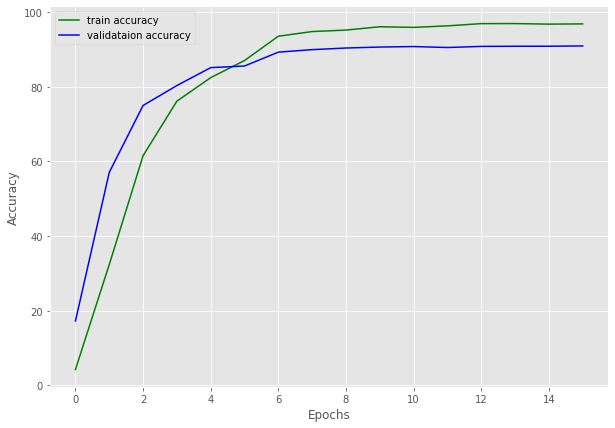

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(train_acc, color='green', linestyle='-', label='train accuracy')
plt.plot(valid_acc, color='blue', linestyle='-', label='validataion accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig(F"/content/drive/My Drive/enpm809k/CarNet/outputs/accuracy.png")
plt.show()

Loss plots

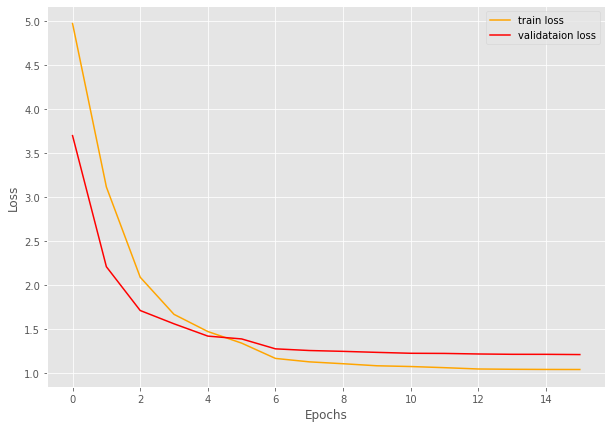

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(train_loss, color='orange', linestyle='-', label='train loss')
plt.plot(valid_loss, color='red', linestyle='-', label='validataion loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(f"/content/drive/My Drive/enpm809k/CarNet/outputs/loss.png")
plt.show()

Learning rate curves

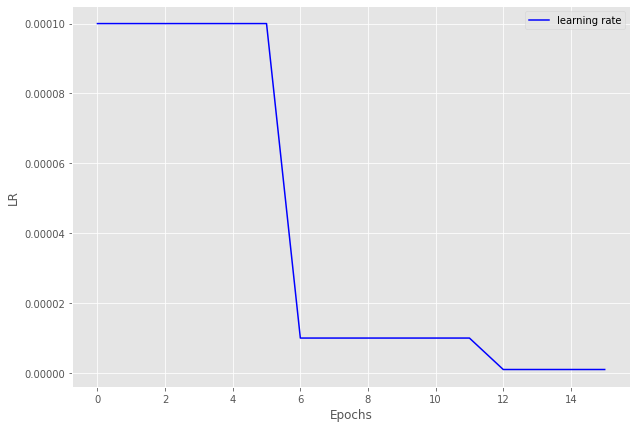

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(learning_rate, color='blue', linestyle='-', label='learning rate')
plt.xlabel('Epochs')
plt.ylabel('LR')
plt.legend()
plt.savefig(f"/content/drive/My Drive/enpm809k/CarNet/outputs/LR.png")
plt.show()

F1 score

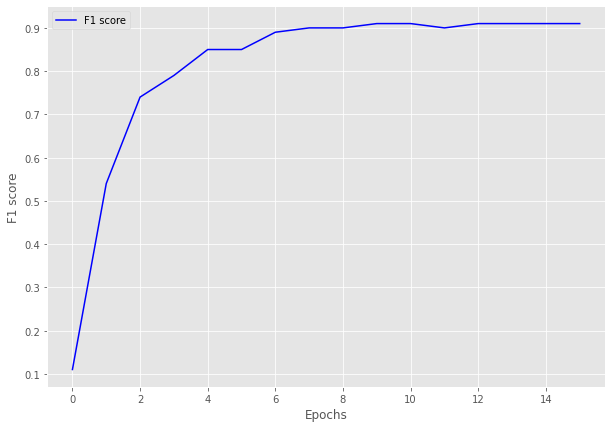

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(validation_tmetric_f1score, color='blue', linestyle='-', label='F1 score')
plt.xlabel('Epochs')
plt.ylabel('F1 score')
plt.legend()
plt.savefig(f"/content/drive/My Drive/enpm809k/CarNet/outputs/TMf1.png")
plt.show()

In [ ]:
torch.save({'epoch': epochs,'model_state_dict': model.state_dict(),'optimizer_state_dict': optimizer.state_dict(),'loss': criterion,}, F"/content/drive/My Drive/enpm809k/CarNet/outputs/model.pth")

### Evaluation and generating output image prediction overlay text
Saving it on drive mounted earlier
### Load trained model

In [14]:
from matplotlib.colors import to_rgba_array
os.makedirs('/content/drive/My Drive/enpm809k/CarNet//outputs/cam_results/', exist_ok=True)
device = ('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model(
    pretrained=False,
    fine_tune=False, 
    num_classes=196
).to(device)
model = model.eval()
model.load_state_dict(torch.load('/content/drive/My Drive/enpm809k/CarNet/outputs/model.pth')['model_state_dict'])
# Define the transforms, resize => tensor => normalize.
transform = transforms.Compose(
    [transforms.ToPILImage(),
     transforms.Resize((456, 456)),
     transforms.ToTensor(),
    ])
counter = 0
correct_count = 0
frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second. 
# Run for all the test images.
all_images = glob.glob('/content/drive/My Drive/enpm809k/CarNet/input/car_data/car_data/test/*/*.jpg', recursive=True)
for i, image_path in tqdm(enumerate(all_images), total=len(all_images)):
    # Read the image.
    image = cv2.imread(image_path)
    gt_class = image_path.split(os.path.sep)[-2]
    original_class_folder = image_path.split(os.path.sep)[10]
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width, _ = orig_image.shape
    # Apply the image transforms.
    image_tensor = transform(image)
    # Add batch dimension.
    image_tensor = image_tensor.unsqueeze(0)
    # Forward pass through model.
    start_time = time.time()
    outputs = model(image_tensor.to(device))
    end_time = time.time()
    # Get the softmax probabilities.
    probs = F.softmax(outputs).data.squeeze()
    # Get the class indices of top k probabilities.
    class_idx = topk(probs, 1)[1].int()
    pred_class_name = str(global_class_names[int(class_idx)])
    if gt_class == pred_class_name:
        correct_count += 1
    # Generate class activation mapping for the top1 prediction.
    save_name = f"{image_path.split('/')[-1].split('.')[0]}"
    cv2.putText(orig_image, "Acutal class:" + gt_class, (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    if pred_class_name == gt_class:
        cv2.putText(orig_image,"Predicted class:" + pred_class_name, (20, 65), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    else:
        cv2.putText(orig_image, "Predicted class:" + pred_class_name, (20, 65), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2,cv2.LINE_AA)
    # Show and save the results.
    os.makedirs(f'/content/drive/My Drive/enpm809k/CarNet/outputs/cam_results/{original_class_folder}/', exist_ok=True)
    cv2.imwrite(f"/content/drive/My Drive/enpm809k/CarNet/outputs/cam_results/{original_class_folder}/CAM_{save_name}.jpg", orig_image)
    counter += 1
    # Get the current fps.
    fps = 1 / (end_time - start_time)
    # Add `fps` to `total_fps`.
    total_fps += fps
    # Increment frame count.
    frame_count += 1

print(f"Total number of test images: {len(all_images)}")
print(f"Total correct predictions: {correct_count}")
print(f"Accuracy: {correct_count/len(all_images)*100:.3f}")
# calculate and print the average FPS
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

[INFO]: Not loading pre-trained weights
Loaded pretrained weights for efficientnet-b5
[INFO]: Freezing hidden layers...


  0%|          | 0/8041 [00:00<?, ?it/s]

<ipython-input-14-d4642eab1232>:44: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


Total number of test images: 8041
Total correct predictions: 7323
Accuracy: 91.071
Average FPS: 28.345


## Display classified images from each class and their prediction.
###**Correctly** predicted images have both ***green*** text labels: Actual class and Predicted class.

### **Incorrectly** classified images have ***red*** text labels: Predicted class

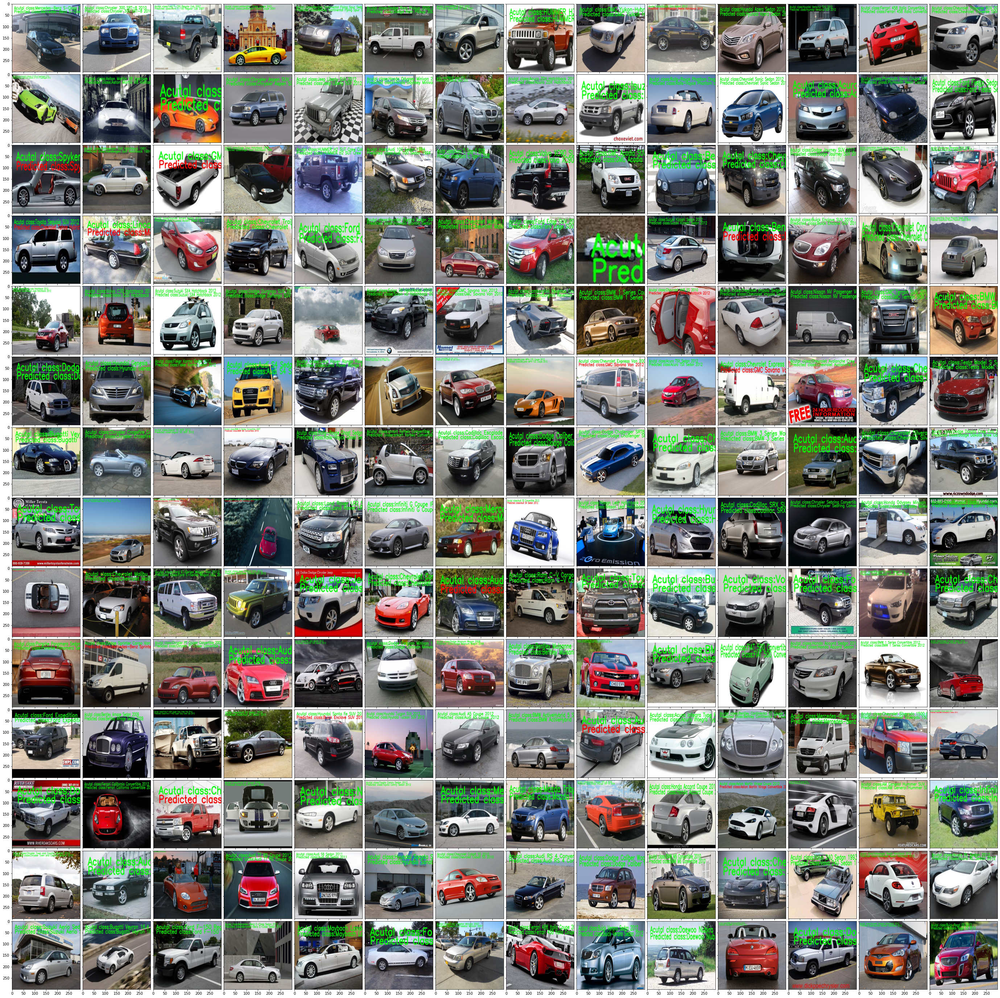

In [15]:
def img_reshape(img):
    img = Image.open(img).convert('RGB')
    img = img.resize((300,300))
    img = np.asarray(img)
    return img

img_arr = []
results = os.listdir('/content/drive/My Drive/enpm809k/CarNet/outputs/cam_results/')

for folder in results:
    folder_class_name = folder.split(os.path.sep)[-1]
    results_folder = '/content/drive/My Drive/enpm809k/CarNet/outputs/cam_results/'+ str(folder_class_name)
    random_file=random.choice(os.listdir(results_folder))
    random_file_path = '/content/drive/My Drive/enpm809k/CarNet/outputs/cam_results/'+ str(folder_class_name) +'/'+ str(random_file)
    img_arr.append(img_reshape(random_file_path))

fig = plt.figure(figsize=(50., 50.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(14, 14),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)

plt.show()